In [62]:
#Bascic libraries
import pandas as pd 
import numpy as np 
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding


#NLTK libraries
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
stop = stopwords.words("english")
english_stemmer=nltk.stem.SnowballStemmer('english')

# Machine Learning libraries
import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
# from sklearn import preprocessing from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

#Visualization libraries
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Other miscellaneous libraries
from scipy import interp
from itertools import cycle
# import cufflinks as cf
from collections import defaultdict
from collections import Counter
from imblearn.over_sampling import SMOTE

# Importing Dataset

In [2]:
sheet_id = '1C9wh8HLncoi4_1OCB-UFmyoMW0h4QYcWswGwC1Qxeik'
df = pd.read_csv(f"https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv")

In [3]:
df.head

<bound method NDFrame.head of              Name     category product_id         user_id        date  \
0    Emma Johnson  Electronics     938562          emma96  2023-04-27   
1      John Smith         Home     284739       johnsmith  2023-04-30   
2       Sarah Lee     Clothing     672915       sarah_lee  2023-04-26   
3       Alex Chen       Beauty     583029        alexc123  2023-05-01   
4      Rachel Kim       Sports     109385         rachelk  2023-04-28   
..            ...          ...        ...             ...         ...   
110       Jackson        Books       1234           user8  2023-04-29   
111       Madison        Music      45678           user9  2023-04-28   
112      Benjamin         Home      24680          user10  2023-04-27   
113    jai deepak       mobile       1111  90845jhsjf8af2  2023-05-21   
114    jai deepak       mobile       1111  90845jhsjf8af2  2023-05-21   

         time                     Email  rating  \
0       13:23  emma.johnson@example.com   

In [4]:
df

,Name,category,product_id,user_id,date,time,Email,rating,Feedback,Sentiment,Id,label
0,Emma Johnson,Electronics,938562,emma96,2023-04-27,13:23,emma.johnson@example.com,4,jaideepak.s.h.2020.cse@ritchennai.edu.inThe pr...,NaN,1,0
1,John Smith,Home,284739,johnsmith,2023-04-30,9:47,john.smith@example.com,3,@user when a father is dysfunctional and is so...,NaN,2,0
2,Sarah Lee,Clothing,672915,sarah_lee,2023-04-26,18:12,sarah.lee@example.com,5,@love the design and quality! #good,NaN,3,0
3,Alex Chen,Beauty,583029,alexc123,2023-05-01,21:01,alex.chen@example.com,4,"Works well, but the smell is too strong. #best",NaN,4,0
4,Rachel Kim,Sports,109385,rachelk,2023-04-28,15:37,rachel.kim@example.com,5,Great product! I use it every day! #useful,NaN,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...
110,Jackson,Books,1234,user8,2023-04-29,4:15 PM,jackson@yahoo.com,1,"""The book arrived with pages missing. 🤨""#worst",NaN,111,1
111,Madison,Music,45678,user9,2023-04-28,6:45 PM,madison@hotmail.com,2,"""The sound quality was poor and distorted. 😔""#bad",NaN,112,1
112,Benjamin,Home,24680,user10,2023-04-27,12:00 PM,benjamin@gmail.com,1,"""The product arrived late and damaged. 😡""#worst",NaN,113,1
113,jai deepak,mobile,1111,90845jhsjf8af2,2023-05-21,11:50,deepak@gmail.com,4,great,NaN,114,1


# Preprocessing and cleaning

# Handling NuN values

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Name        115 non-null    object 
 1   category    115 non-null    object 
 2   product_id  115 non-null    object 
 3   user_id     115 non-null    object 
 4   date        115 non-null    object 
 5   time        115 non-null    object 
 6   Email       115 non-null    object 
 7   rating      115 non-null    int64  
 8   Feedback    115 non-null    object 
 9   Sentiment   0 non-null      float64
 10  Id          115 non-null    int64  
 11  label       115 non-null    int64  
dtypes: float64(1), int64(3), object(8)
memory usage: 10.9+ KB


In [6]:
df.describe()

,rating,Sentiment,Id,label
count,115.000000,0.0,115.000000,115.000000
mean,3.452174,NaN,58.000000,0.130435
std,0.871009,NaN,33.341666,0.338255
min,1.000000,NaN,1.000000,0.000000
25%,3.000000,NaN,29.500000,0.000000
50%,4.000000,NaN,58.000000,0.000000
75%,4.000000,NaN,86.500000,0.000000
max,5.000000,NaN,115.000000,1.000000


In [7]:
df.isnull().sum()

Name            0
category        0
product_id      0
user_id         0
date            0
time            0
Email           0
rating          0
Feedback        0
Sentiment     115
Id              0
label           0
dtype: int64

# Counting Rating values

In [8]:
df['rating'].value_counts()

4    61
3    35
2     9
5     5
1     5
Name: rating, dtype: int64

In [9]:
df['category'].value_counts()

Beauty           15
Electronics      14
Home             12
Clothing         12
Sports           12
Food             12
Health            8
Books             8
Toys              8
Music             8
Home & Garden     4
mobile            2
Name: category, dtype: int64

In [10]:
df['Feedback'].value_counts()

The product didn't work as well as I had hoped                                        5
The product didn't work for me, but the customer service was helpful                  2
jaideepak.s.h.2020.cse@ritchennai.edu.inThe product works great! 👍                    1
The clothing was stylish and comfortable to wear                                      1
This product exceeded my expectations, it is well-made and looks great in my home.    1
                                                                                     ..
The product helped me feel better, I would recommend it                               1
The food was delicious and arrived on time                                            1
The product broke after a few uses, I was disappointed                                1
The product was exactly what I was looking for                                        1
wow awesome                                                                           1
Name: Feedback, Length: 110, dty

In [15]:
def cleaning( review, remove_stopwords=True):
   
    

    review_text = re.sub("[^a-zA-Z]"," ", review)
   
    words = review_text.lower().split()
    
    if remove_stopwords:
        stops = set(stopwords.words("english"))
        words = [w for w in words if not w in stops]

    b=[]
    stemmer = english_stemmer 
    for word in words:
        b.append(stemmer.stem(word))

    
    return(b)

In [18]:

clean_Text = []
for review in df['Feedback']:
    clean_Text.append( " ".join(cleaning(review)))
    
clean_summary = []
for review in df['Feedback']:
    clean_summary.append( " ".join(cleaning(review)))

In [19]:
Top_Words_Review =pd.Series(' '.join(clean_Text).lower().split()).value_counts()[:10]
print ("Top Count Words Used In Review", Top_Words_Review)

Top Count Words Used In Review product    62
work       24
good       19
great      18
well       16
qualiti    14
expect     12
bit        11
arriv      11
food        9
dtype: int64


In [20]:
def sentiment(label):
    if label == 5.0 or label == 4.0:
        return "Positive"
    elif label == 3.0:
        return "Neutral"
    elif label == 1.0 or label == 2.0:
        return "Negative"

In [21]:
df['Sentiment'] = df["rating"].apply(sentiment)

In [22]:
df

,Name,category,product_id,user_id,date,time,Email,rating,Feedback,Sentiment,Id,label
0,Emma Johnson,Electronics,938562,emma96,2023-04-27,13:23,emma.johnson@example.com,4,jaideepak.s.h.2020.cse@ritchennai.edu.inThe pr...,Positive,1,0
1,John Smith,Home,284739,johnsmith,2023-04-30,9:47,john.smith@example.com,3,@user when a father is dysfunctional and is so...,Neutral,2,0
2,Sarah Lee,Clothing,672915,sarah_lee,2023-04-26,18:12,sarah.lee@example.com,5,@love the design and quality! #good,Positive,3,0
3,Alex Chen,Beauty,583029,alexc123,2023-05-01,21:01,alex.chen@example.com,4,"Works well, but the smell is too strong. #best",Positive,4,0
4,Rachel Kim,Sports,109385,rachelk,2023-04-28,15:37,rachel.kim@example.com,5,Great product! I use it every day! #useful,Positive,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...
110,Jackson,Books,1234,user8,2023-04-29,4:15 PM,jackson@yahoo.com,1,"""The book arrived with pages missing. 🤨""#worst",Negative,111,1
111,Madison,Music,45678,user9,2023-04-28,6:45 PM,madison@hotmail.com,2,"""The sound quality was poor and distorted. 😔""#bad",Negative,112,1
112,Benjamin,Home,24680,user10,2023-04-27,12:00 PM,benjamin@gmail.com,1,"""The product arrived late and damaged. 😡""#worst",Negative,113,1
113,jai deepak,mobile,1111,90845jhsjf8af2,2023-05-21,11:50,deepak@gmail.com,4,great,Positive,114,1


# Sentiment Analysis

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=4, max_features = 10000)
vz = vectorizer.fit_transform(clean_Text)
tfidf = dict(zip(vectorizer.get_feature_names_out(), vectorizer.idf_))
print("work : " + str(tfidf["well"]))
print("good: " + str(tfidf["good"]))
print("expect : " + str(tfidf["bit"]))
print("music: " + str(tfidf["music"]))
print("arriv: " + str(tfidf["arriv"]))

work : 2.9203768470501483
good: 2.7578579175523736
expect : 3.268683541318364
music: 3.6741486494265287
arriv: 3.268683541318364


In [24]:
clean_Feedback = []
for review in df['Feedback']:
    clean_Feedback.append( " ".join(cleaning(review)))

In [25]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
Senti = SentimentIntensityAnalyzer()
sample_review = clean_Text[:100]
for sentence in sample_review:
    sentence
    ss = Senti.polarity_scores(sentence)
    for k in sorted(ss):
        print('{0}: {1}, '.format(k, ss[k]))
    print(sentence) 
    

compound: 0.6249, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
jaideepak h cse ritchennai edu inth product work great
compound: -0.6124, 
neg: 0.5, 
neu: 0.5, 
pos: 0.0, 
user father dysfunct selfish drag kid dysfunct
compound: 0.7964, 
neg: 0.0, 
neu: 0.22, 
pos: 0.78, 
love design qualiti good
compound: 0.8625, 
neg: 0.0, 
neu: 0.172, 
pos: 0.828, 
work well smell strong best
compound: 0.6249, 
neg: 0.0, 
neu: 0.549, 
pos: 0.451, 
great product use everi day use
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
flavor bit bland need season wast
compound: 0.3612, 
neg: 0.0, 
neu: 0.615, 
pos: 0.385, 
product chang life thank awesom
compound: 0.4215, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
okay worth price wast
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
wast product
compound: 0.7906, 
neg: 0.0, 
neu: 0.3, 
pos: 0.7, 
great qualiti fast ship good
compound: 0.765, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
materi great fit littl tight
compound: 0.2732, 
neg: 0.0, 
neu: 0.741, 
pos: 0.259, 
devic 

In [28]:
from sklearn.cluster import MiniBatchKMeans

num_clusters = 10
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=1000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()
for i in range(num_clusters):
    print("Cluster %d:" % i)
    for j in sorted_centroids[i, :5]:
        print(' %s' % terms[j])
    print()

Cluster 0:
 wast
 bit
 product
 work
 worst

Cluster 1:
 bit
 good
 small
 product
 tast

Cluster 2:
 arriv
 damag
 worst
 time
 product

Cluster 3:
 toy
 entertain
 bit
 expect
 love

Cluster 4:
 improv
 help
 product
 well
 work

Cluster 5:
 exact
 look
 product
 arriv
 love

Cluster 6:
 work
 well
 hope
 product
 best

Cluster 7:
 great
 use
 qualiti
 product
 good

Cluster 8:
 okay
 price
 food
 product
 arriv

Cluster 9:
 expect
 product
 easi
 work
 good



In [63]:
Text = df.Feedback
Ratings = df.rating
vectorizer = TfidfVectorizer(max_df=.8)
vectorizer.fit(Text)
def categorize(ratings):
    cats = []
    for rating in ratings:
        v = [0,0,0,0,0]
        v[int(rating)-1] = 1
        cats.append(v)
    return np.array(cats)

X = vectorizer.transform(Text).toarray()
y = categorize(Ratings.values)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.2)

model = Sequential()
model.add(Dense(128,input_dim=X_train.shape[1]))
model.add(Dense(5,activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='rmsprop',metrics=['accuracy'])
model.fit(X_train,y_train,epochs=10,batch_size=32,verbose=1)
model.evaluate(X_test,y_test)[1]

Epoch 1/10
3/3 [==============================] - 1s 5ms/step - loss: 1.5627 - accuracy: 0.3478
Epoch 2/10
3/3 [==============================] - 0s 4ms/step - loss: 1.4122 - accuracy: 0.7283
Epoch 3/10
3/3 [==============================] - 0s 4ms/step - loss: 1.3089 - accuracy: 0.7283
Epoch 4/10
3/3 [==============================] - 0s 6ms/step - loss: 1.2219 - accuracy: 0.7391
Epoch 5/10
3/3 [==============================] - 0s 4ms/step - loss: 1.1418 - accuracy: 0.7391
Epoch 6/10
3/3 [==============================] - 0s 4ms/step - loss: 1.0701 - accuracy: 0.7283
Epoch 7/10
3/3 [==============================] - 0s 4ms/step - loss: 1.0048 - accuracy: 0.7391
Epoch 8/10
3/3 [==============================] - 0s 5ms/step - loss: 0.9451 - accuracy: 0.7391
Epoch 9/10
3/3 [==============================] - 0s 4ms/step - loss: 0.8897 - accuracy: 0.7391
Epoch 10/10
1/1 [==============================] - 0s 391ms/step - loss: 1.3456 - accuracy: 0.4783


0.47826087474823

In [32]:
pd.DataFrame(df.groupby('Sentiment')['rating'].mean())

,rating
Sentiment,
Negative,1.642857
Neutral,3.000000
Positive,4.075758


# Analysing Sentiment using Unique Userid

In [33]:
from sklearn.model_selection import StratifiedShuffleSplit
print("Before : {}".format(len(df)))
dfAfter = df.dropna(subset=["rating"])
# Removes all NAN in reviews.rating
print("After  : {}".format(len(dfAfter)))
dfAfter["rating"] = dfAfter["rating"].astype(int)

split = StratifiedShuffleSplit(n_splits=10, test_size=0.2)
for train_index, test_index in split.split(dfAfter,
                                           dfAfter["rating"]):
    strat_train = dfAfter.reindex(train_index)
    strat_test = dfAfter.reindex(test_index)

Before : 115
After  : 115


In [34]:
print(len(strat_train))
print(len(strat_test))
round((strat_test["rating"].value_counts()* 100/len(strat_test)),2)

92
23


4    52.17
3    30.43
2     8.70
1     4.35
5     4.35
Name: rating, dtype: float64

In [35]:
reviews = strat_train.copy()
reviews.head()

,Name,category,product_id,user_id,date,time,Email,rating,Feedback,Sentiment,Id,label
103,Emma Davis,Food,FOO9012,USR012,2022-11-28,20:15:00,emma.davis@example.com,3,The food was delicious and the portions were j...,Neutral,104,0
69,Ethan Garcia,Books,BOO9012,USR345,2022-10-09,8:35:00,ethan.garcia@example.com,4,The book was a great read and very informative,Positive,70,0
5,Michael Tan,Food,827461,michaeltan,2023-05-02,12:09,michael.tan@example.com,2,The flavor is a bit bland. Needs more seasonin...,Negative,6,1
30,Kevin Lee,Electronics,ELEC2345,USR345,2022-11-02,9:10:00,kevin.lee@example.com,4,The product met my expectations and was easy t...,Positive,31,0
83,Jason Lee,Sports,PRD000001,USR0001,2022-03-21,11:30 AM,jason.lee@example.com,3,"The product was okay, but it arrived later tha...",Neutral,84,0


In [36]:
len(reviews["Name"].unique())

81

In [37]:
len(reviews["user_id"].unique())

43

In [38]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92 entries, 103 to 48
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Name        92 non-null     object
 1   category    92 non-null     object
 2   product_id  92 non-null     object
 3   user_id     92 non-null     object
 4   date        92 non-null     object
 5   time        92 non-null     object
 6   Email       92 non-null     object
 7   rating      92 non-null     int32 
 8   Feedback    92 non-null     object
 9   Sentiment   92 non-null     object
 10  Id          92 non-null     int64 
 11  label       92 non-null     int64 
dtypes: int32(1), int64(2), object(9)
memory usage: 9.0+ KB


In [39]:
reviews.groupby("user_id")["Feedback"].unique()

user_id
90845jhsjf8af2                                 [great, wow awesome]
USR0001           [The product was okay, but it arrived later th...
USR0002           [I absolutely love this product, it has made a...
USR0003           [The shirt I bought was too small, even though...
USR0004           [This product exceeded my expectations, it is ...
USR0005           [The product is exactly what I needed, it work...
USR0007           [This product is great, but it is a bit expens...
USR0008           [The dress I ordered didn't fit well, even tho...
USR0009           [This product is exactly what I was looking fo...
USR001            [The product is great, but the packaging could...
USR0010           [The product is good, but it didn't quite meet...
USR002            [The shirt I bought was a bit too small, but t...
USR003            [The product arrived damaged and customer serv...
USR004            [Absolutely love this product, would highly re...
USR006            [The product tasted go

In [40]:
def sentiments(rating):
    if (rating == 5) or (rating == 4):
        return "Positive"
    elif rating == 3:
        return "Neutral"
    elif (rating == 2) or (rating == 1):
        return "Negative"
# Add sentiments to the data
strat_train["Sentiment"] = strat_train["rating"].apply(sentiments)
strat_test["Sentiment"] = strat_test["rating"].apply(sentiments)
print(strat_train["Sentiment"][:15])

103     Neutral
69     Positive
5      Negative
30     Positive
83      Neutral
99      Neutral
13      Neutral
28      Neutral
50     Positive
36     Positive
75     Positive
55     Positive
81     Positive
53      Neutral
20     Positive
Name: Sentiment, dtype: object


In [41]:
round((strat_train["Sentiment"].value_counts()*100/len(strat_train)),2)

Positive    57.61
Neutral     30.43
Negative    11.96
Name: Sentiment, dtype: float64

In [42]:
round((strat_test["Sentiment"].value_counts()*100/len(strat_test)),2)

Positive    56.52
Neutral     30.43
Negative    13.04
Name: Sentiment, dtype: float64

In [64]:
model = Sequential()
model.add(Embedding(500, 120, input_length= X.shape[1]))
model.add(LSTM(64))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 253, 120)          60000     
                                                                 
 lstm (LSTM)                 (None, 64)                47360     
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 107,425
Trainable params: 107,425
Non-trainable params: 0
_________________________________________________________________
None


# Analysis Using Graph

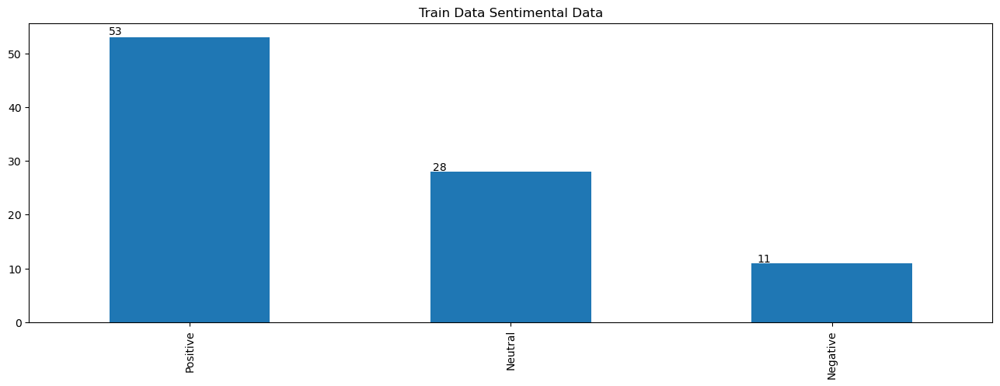

In [44]:
fig = plt.figure(figsize=(16,5))
ax=strat_train["Sentiment"].value_counts().plot(kind="bar", title="Train Data Sentimental Data")
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

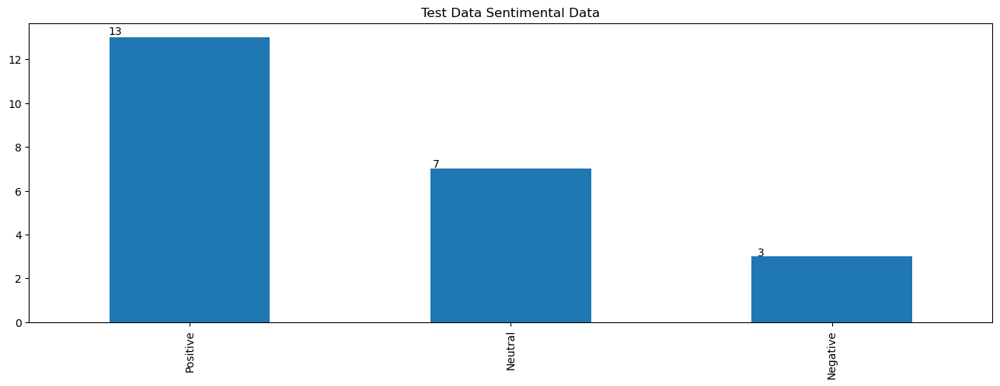

In [45]:
fig = plt.figure(figsize=(16,5))
ax=strat_test["Sentiment"].value_counts().plot(kind="bar", title="Test Data Sentimental Data")
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

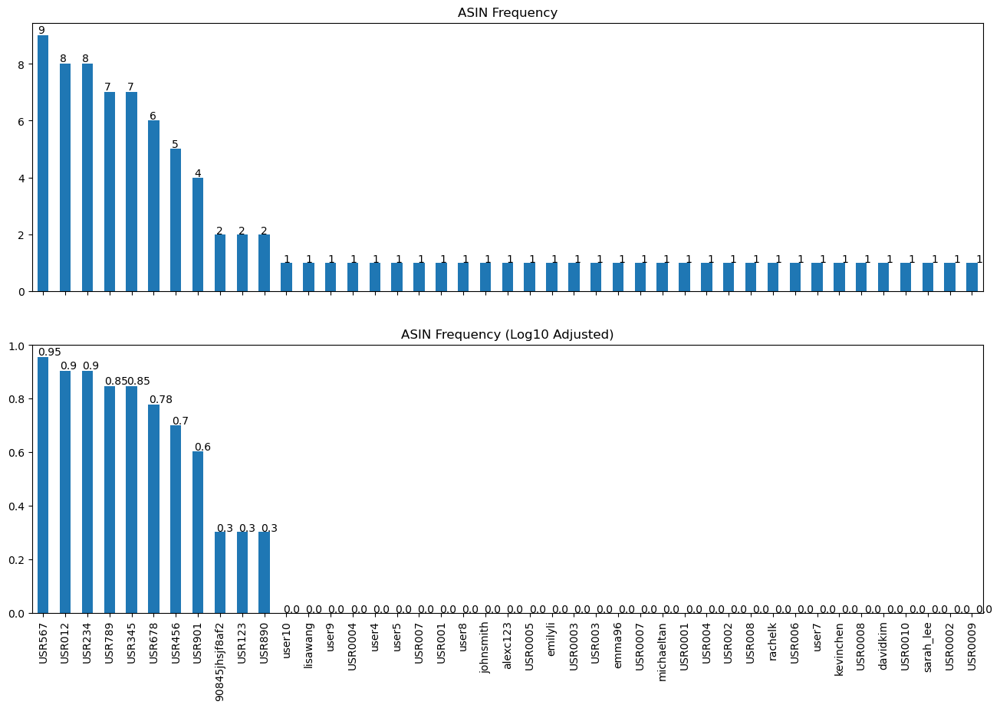

In [46]:
fig = plt.figure(figsize=(16,10))
ax1 = plt.subplot(211)
ax2 = plt.subplot(212, sharex = ax1)
reviews["user_id"].value_counts().plot(kind="bar", ax=ax1, title="ASIN Frequency")
np.log10(reviews["user_id"].value_counts()).plot(kind="bar", ax=ax2,
                                               title="ASIN Frequency (Log10 Adjusted)")
for p in ax1.patches:
    ax1.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
for p in ax2.patches:
    ax2.annotate(str(round((p.get_height()),2)), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

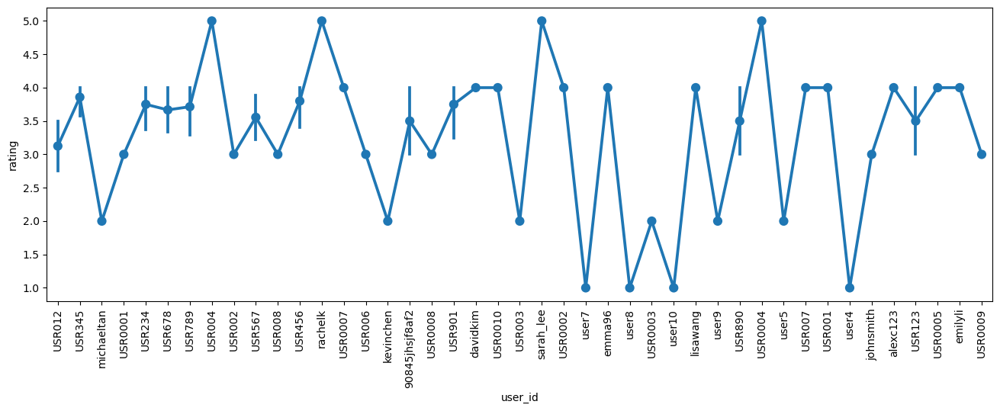

In [47]:
fig = plt.figure(figsize=(16,5))
sns.pointplot(x="user_id", y="rating",  data=reviews)
plt.xticks(rotation=90)
plt.show()

<Axes: xlabel='rating', ylabel='count'>

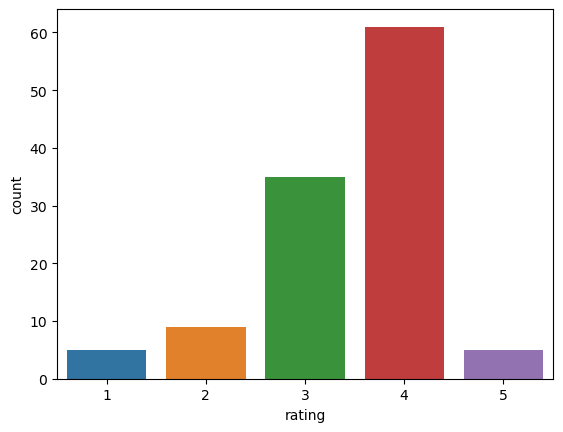

In [48]:
sns.countplot(x='rating', data=df)

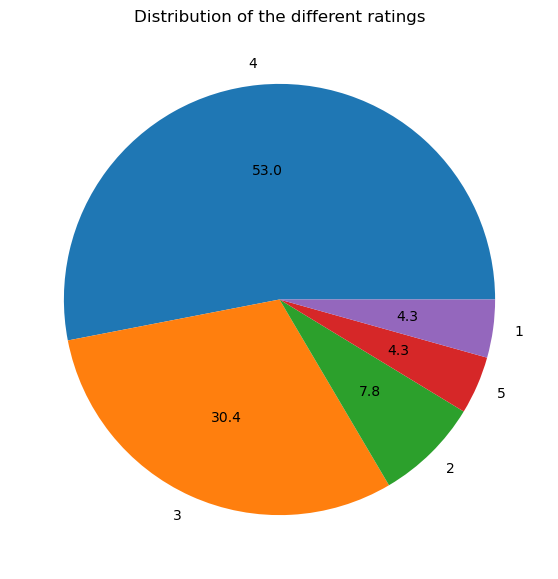

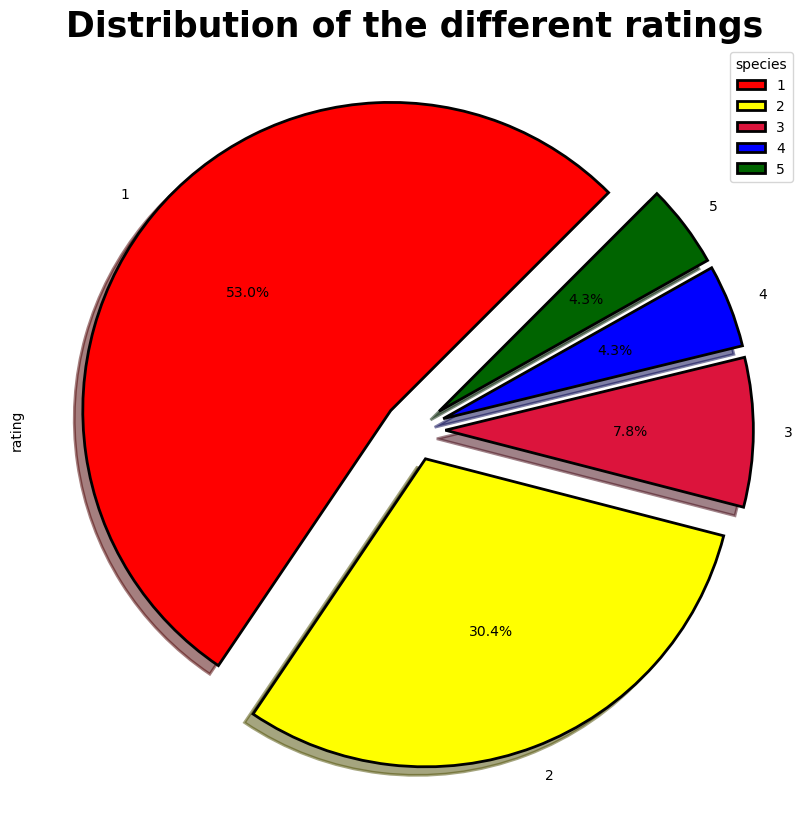

In [49]:
fig = plt.figure(figsize=(7,7))
tags = df['rating'].value_counts()
tags.plot(kind='pie', autopct='%1.1f', label='')
plt.title('Distribution of the different ratings')
plt.show()

fig = plt.figure(figsize=(10,10))
colors = ("red", "yellow", "crimson", "blue", "darkgreen") 
wp = {'linewidth':2, 'edgecolor':"black"} 
data = df['rating'].value_counts()
explode = (0.1,0.1,0.1, 0.1,0.1)
classes = ['1','2','3','4','5']
data.plot(kind='pie', autopct='%0.1f%%',labels=classes, startangle = 45, colors = colors,
         explode = explode, shadow=True, wedgeprops = wp)
plt.legend(title="species")
plt.title("Distribution of the different ratings", loc='center', color='black', fontsize='25', fontweight='bold')
plt.show()

<Axes: xlabel='count', ylabel='category'>

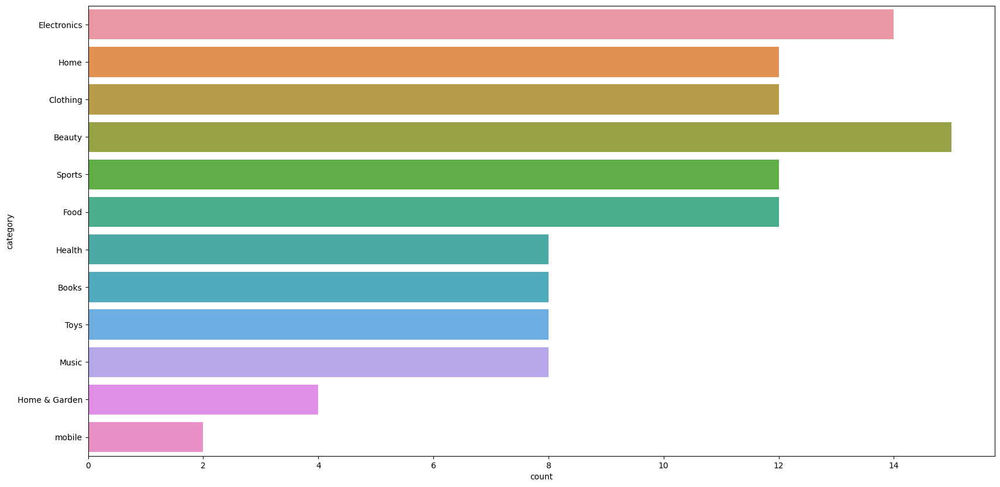

In [50]:
fig = plt.figure(figsize=(20,10))
sns.countplot(y='category', data=df)

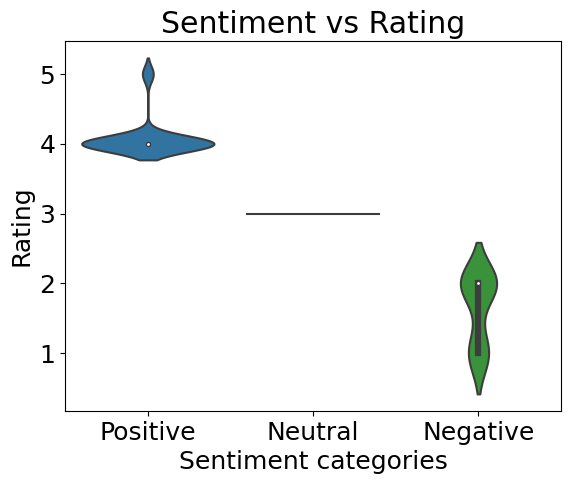

In [51]:
#plot layout
plt.rcParams.update({'font.size': 18})
# rcParams['figure.figsize'] = 16,9

# Creating dataframe and removing 0 helpfulrate records
senti_help= pd.DataFrame(df, columns = ['Sentiment', 'rating'])
senti_help = senti_help[senti_help['rating'] != 0.00] 

#Plotting phase
sns.violinplot( x=senti_help["Sentiment"], y=senti_help["rating"])
plt.title('Sentiment vs Rating')
plt.xlabel('Sentiment categories')
plt.ylabel('Rating')
plt.show()

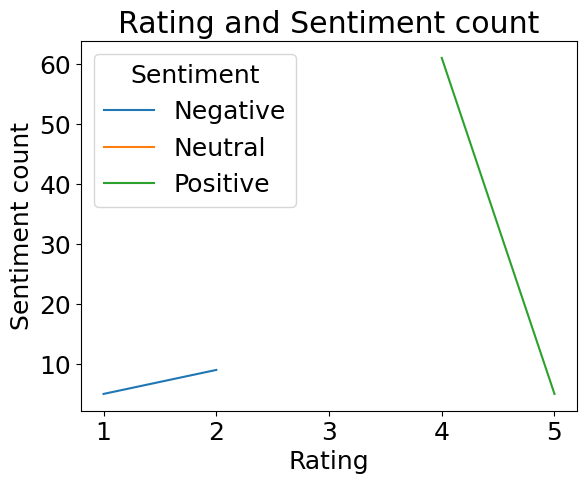

In [52]:
df.groupby(['rating','Sentiment'])['Sentiment'].count().unstack().plot(legend=True)
plt.title('Rating and Sentiment count')
plt.xlabel('Rating')
plt.ylabel('Sentiment count')
plt.show()

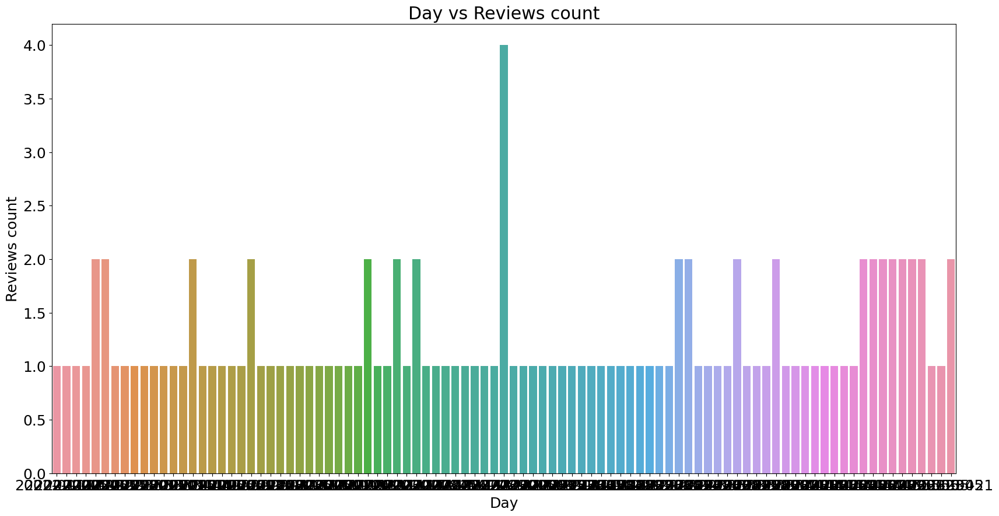

In [53]:
day=pd.DataFrame(df.groupby('date')['Feedback'].count()).reset_index()
day['date']=day['date'].astype('str')
day.sort_values(by=['date'])
fig = plt.figure(figsize=(20,10))

#Plotting the graph
sns.barplot(x="date", y="Feedback", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

In [54]:
review_pos = df[df["Sentiment"]=='Positive'].dropna()
review_neu = df[df["Sentiment"]=='Neutral'].dropna()
review_neg = df[df["Sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["Feedback"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Feedback"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Feedback"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

In [55]:
freq_dict = defaultdict(int)
for sent in review_pos["Feedback"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Feedback"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Feedback"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

In [56]:
for sent in review_pos["Feedback"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Feedback"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Feedback"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')




# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews", 
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
iplot(fig, filename='word-plots')

# Wordcloud

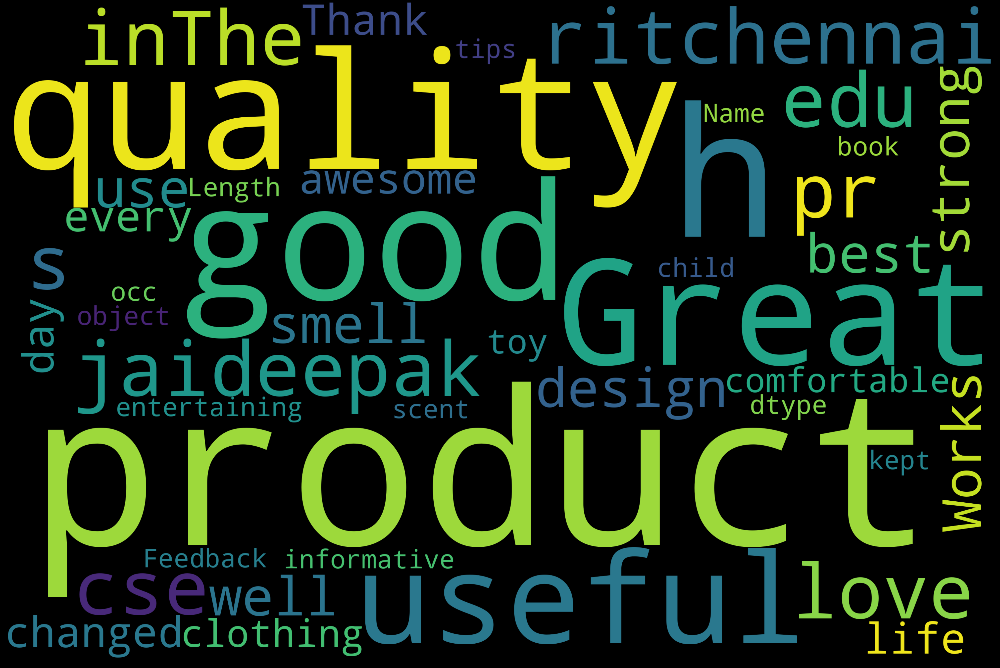

In [57]:
text = review_pos["Feedback"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

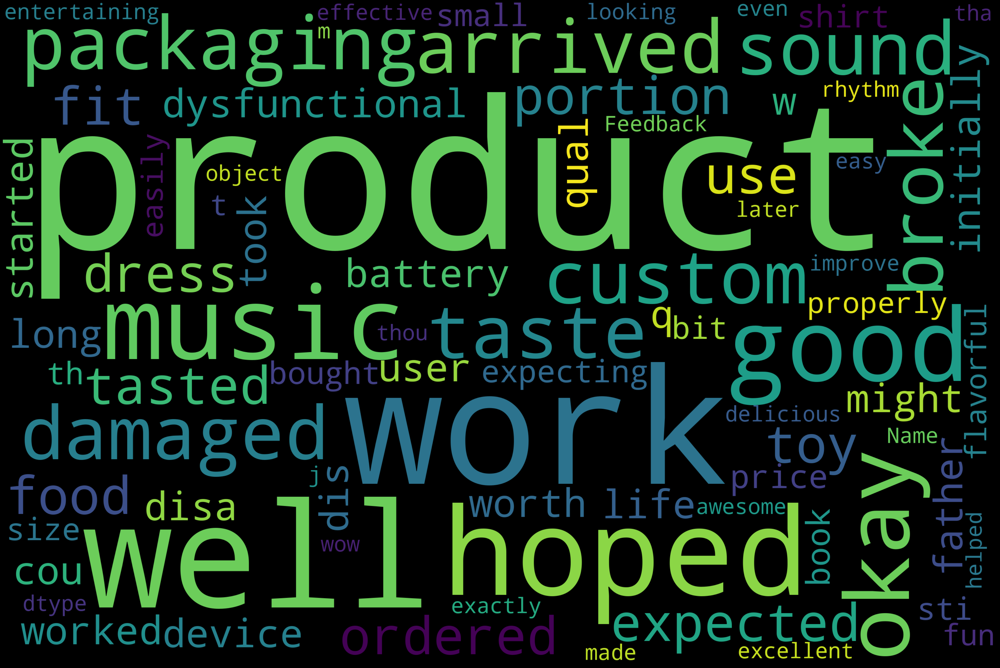

In [58]:
text = review_neu["Feedback"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

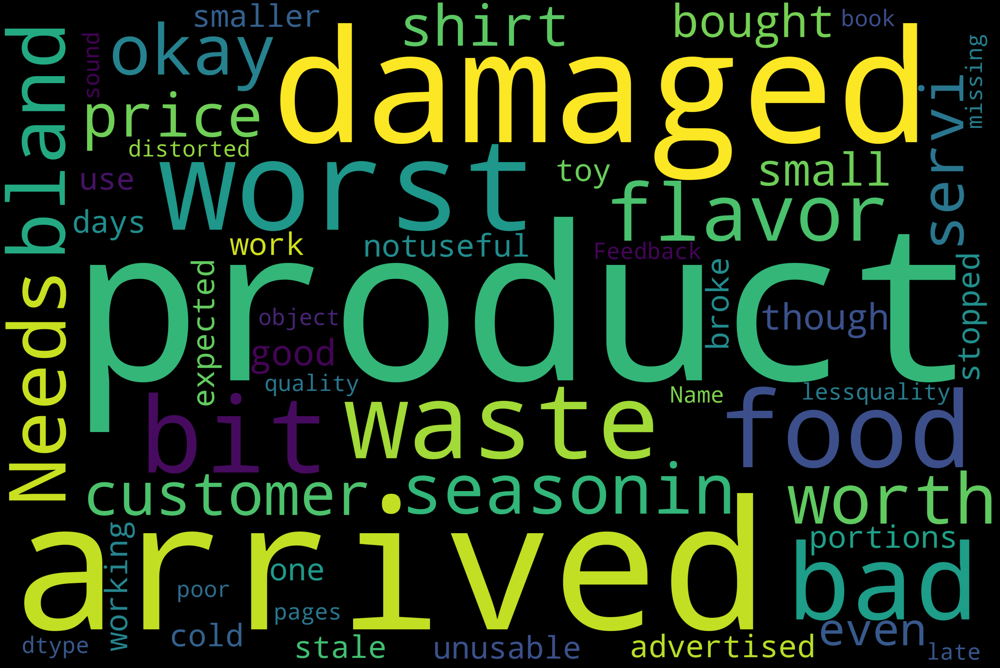

In [59]:
text = review_neg["Feedback"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()